In [1]:
import numpy as np
import h5py
import cv2
import os, sys
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0" # "0,1,2,3" # "0"
import matplotlib.pyplot as plt
from copy import deepcopy
from core.median_filter import apply_median_filter_gpu_simple
from core.CD_measure import *
from skimage.metrics import *
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import json
%load_ext autoreload
%autoreload 2

In [2]:
# SET08_F01_01 - F08_v2 - F04
# SET10_F02_01 - F08_v2 - F02
# SET08_F01_00 - F08_v2 - F01

## F08_v2 - F08


SET02_F08_04	SET02_F08_05	SET02_F08_06	SET02_F08_07  : denoised & median

In [ ]:
key_list = ['SET02_F32_04',	'SET02_F32_05','SET02_F32_06','SET02_F32_07']

In [22]:
target = 'F08_v2'
denoised_npy = f'./intermediate_result/denoised_img_{target}_img_dict.npy'
denoised_images = np.load(denoised_npy,allow_pickle=True).item()
segmentation_npy = f'./intermediate_result/segmentation_img_{target}.npy'
segmentation_images = np.load(segmentation_npy,allow_pickle=True).item()

In [15]:
for img in denoised_img:
    print(img)
    break

SET01


In [26]:
def show_img(key, denoised_images,segmentation_images):
    
    set_num, f_num, idx = key.split('_')
    denoised_img = denoised_images[set_num][f_num][int(idx)][0]
    segmentation_img = segmentation_images[set_num][f_num][int(idx)]
    plt.title(key)
    plt.imshow(denoised_img)
    plt.pause(0.01)
    plt.title(key)
    plt.imshow(segmentation_img)
    plt.pause(0.01)

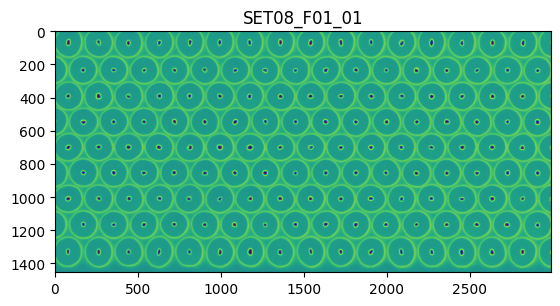

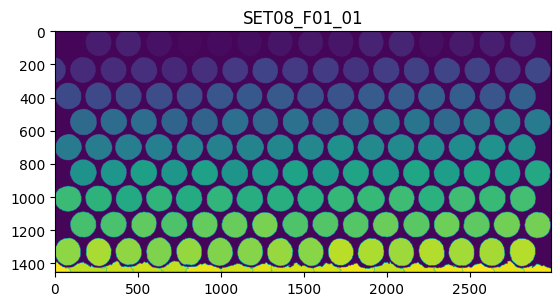

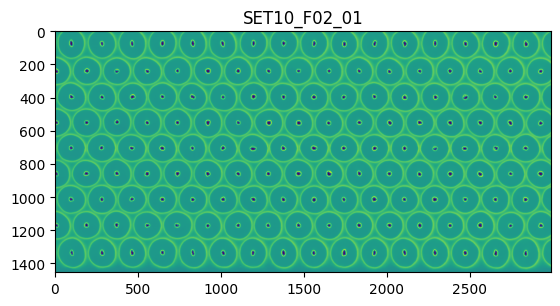

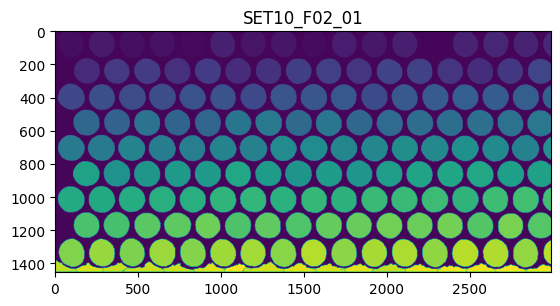

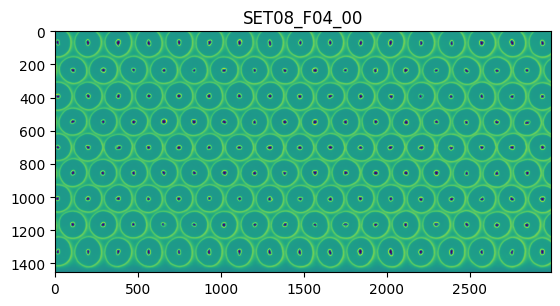

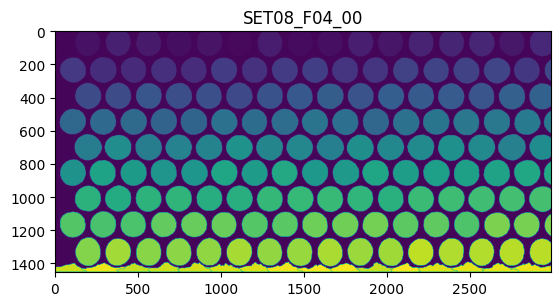

In [27]:
# SET08_F01_01 - F08_v2 - F01
show_img('SET08_F01_01', denoised_images,segmentation_images)
# plt.imshow()
# SET10_F02_01 - F08_v2 - F02
show_img('SET10_F02_01', denoised_images,segmentation_images)
# SET08_F04_00 - F08_v2 - F04
show_img('SET08_F04_00', denoised_images,segmentation_images)

In [28]:
target = 'F16_v2'
denoised_npy = f'./intermediate_result/denoised_img_{target}_img_dict.npy'
denoised_images = np.load(denoised_npy,allow_pickle=True).item()
segmentation_npy = f'./intermediate_result/segmentation_img_{target}.npy'
segmentation_images = np.load(segmentation_npy,allow_pickle=True).item()


In [31]:
key = 'SET02_F32_06'

set_num, f_num, idx = key.split('_')
denoised_img = denoised_images[set_num][f_num][int(idx)][0]
segmentation_img = segmentation_images[set_num][f_num][int(idx)]

In [ ]:

denoised_img_uint8 = (denoised_img*255).astype('uint8')
new_segmentation = segmentation_with_masking(denoised_img_uint8,True)

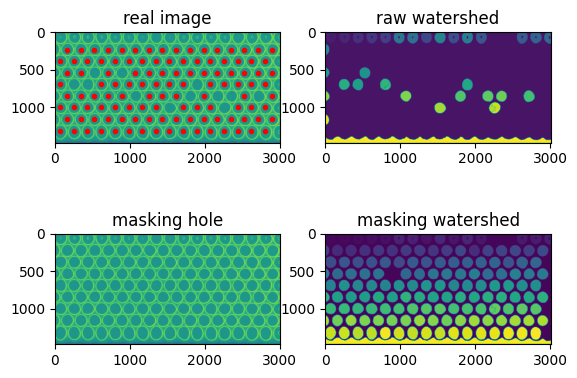

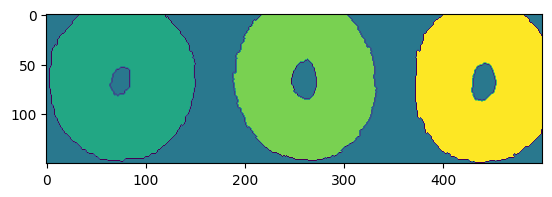

In [53]:
# real_a = denoised_img[:256,:500][:150][:,:160]
# plt.imshow(real_a)
# plt.pause(0.01)
# a = (real_a*255).astype('uint8')
denoised_img_uint8 = (denoised_img*255).astype('uint8')
new_segmentation = segmentation_with_masking(denoised_img_uint8,True)


In [ ]:
get_CD(

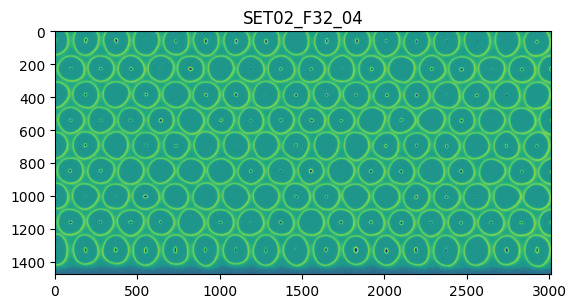

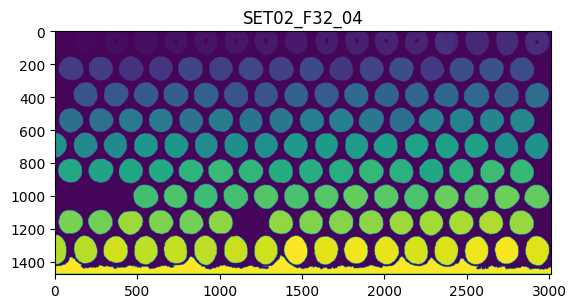

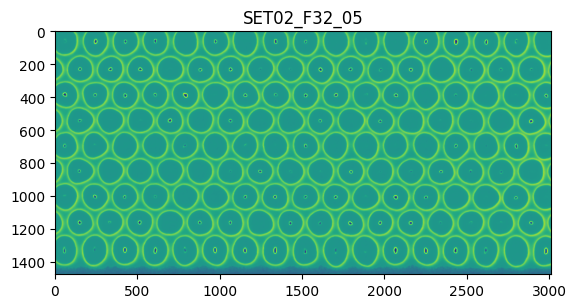

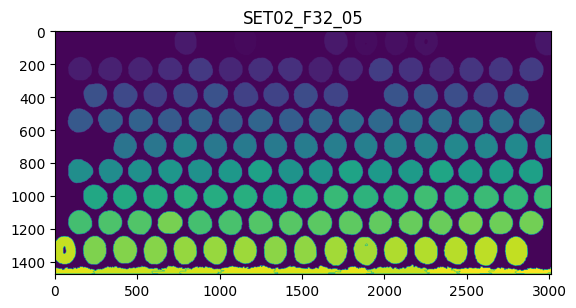

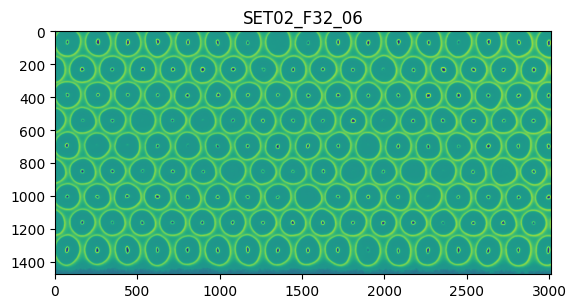

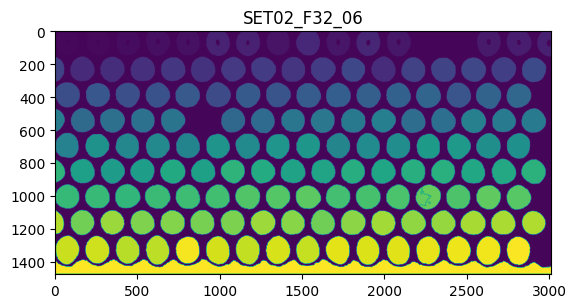

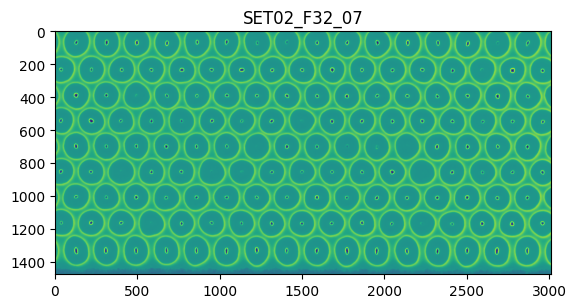

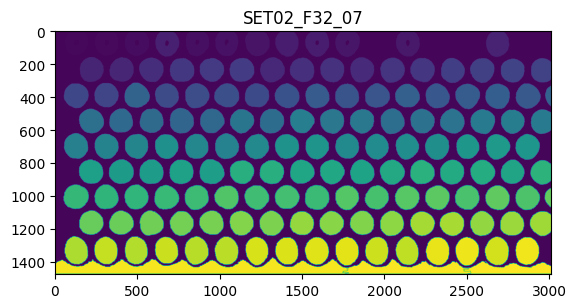

In [29]:

key_list = ['SET02_F32_04',	'SET02_F32_05','SET02_F32_06','SET02_F32_07']
for key in key_list:
    show_img(key, denoised_images,segmentation_images)

In [55]:
target = 'median_filter'
denoised_npy = f'./intermediate_result/denoised_img_{target}_img_dict.npy'
denoised_images = np.load(denoised_npy,allow_pickle=True).item()
segmentation_npy = f'./intermediate_result/segmentation_img_{target}.npy'
segmentation_images = np.load(segmentation_npy,allow_pickle=True).item()


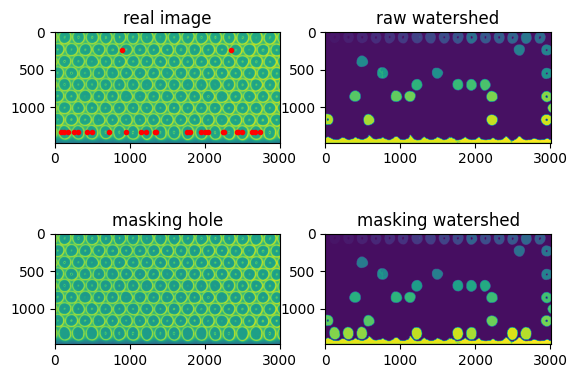

In [57]:

key_list = ['SET02_F32_04',	'SET02_F32_05','SET02_F32_06','SET02_F32_07']
for key in key_list:
    
    set_num, f_num, idx = key.split('_')
    denoised_img = denoised_images[set_num][f_num][int(idx)][0]
    
    denoised_img_uint8 = (denoised_img*255).astype('uint8')
    new_segmentation = segmentation_with_masking(denoised_img_uint8,True)
    # show_img(key, denoised_images,segmentation_images)

In [ ]:

def return_img(img_dict): 
    img_info = {}
    for set_num in img_dict.keys():
        for f_num in img_dict[set_num].keys():
            for idx,img in enumerate(img_dict[set_num][f_num]):
                img_info = {'set_num' : set_num, 'f_num' : f_num, 'idx' : idx}
                yield img_info, img

def return_img_fnum(img_dict,specific_f_num_list): 
    img_info = {}
    for set_num in img_dict.keys():
        for f_num in img_dict[set_num].keys():
            if f_num not in specific_f_num_list:
                continue
            for idx,img in enumerate(img_dict[set_num][f_num]):
                img_info = {'set_num' : set_num, 'f_num' : f_num, 'idx' : idx}
                yield img_info, img

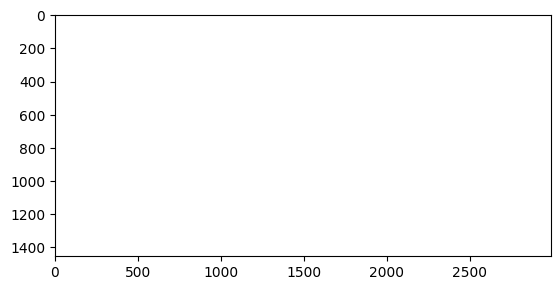

In [73]:
from celluloid import Camera # getting the camera
from IPython.display import HTML
import matplotlib.pyplot as plt
target = 'median_filter'
denoised_npy = f'./intermediate_result/denoised_img_{target}_img_dict.npy'

denoised_images = np.load(denoised_npy,allow_pickle=True).item()
# gen = return_img(denoised_images)
gen = return_img_fnum(denoised_images,['F32'])
fig, ax = plt.subplots() # make it bigger
camera = Camera(fig)# the camera gets our figure
for img_info, img in gen:
    ax.imshow(img[0]) # plotting
    camera.snap()
animation = camera.animate()
HTML(animation.to_html5_video())

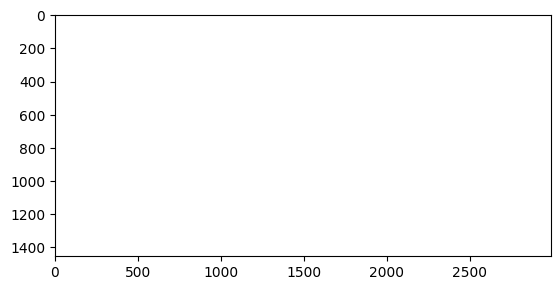

In [74]:
from celluloid import Camera # getting the camera
from IPython.display import HTML
import matplotlib.pyplot as plt
target = 'median_filter'
denoised_npy = f'./intermediate_result/segmentation_img_{target}.npy'

denoised_images = np.load(denoised_npy,allow_pickle=True).item()
# gen = return_img(denoised_images)

gen = return_img_fnum(denoised_images,['F32'])
fig, ax = plt.subplots() # make it bigger
camera = Camera(fig)# the camera gets our figure
for img_info, img in gen:
    ax.imshow(img) # plotting
    camera.snap()
animation = camera.animate()
HTML(animation.to_html5_video())

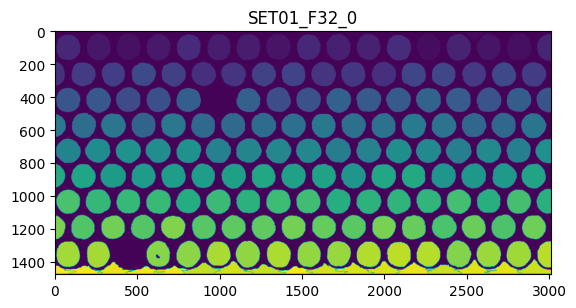

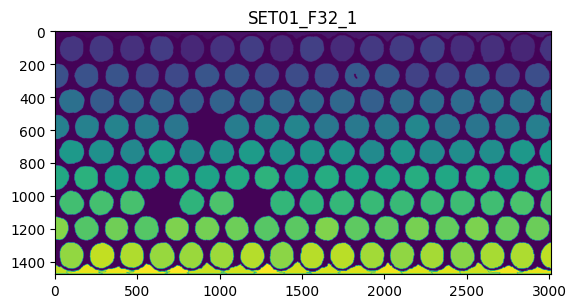

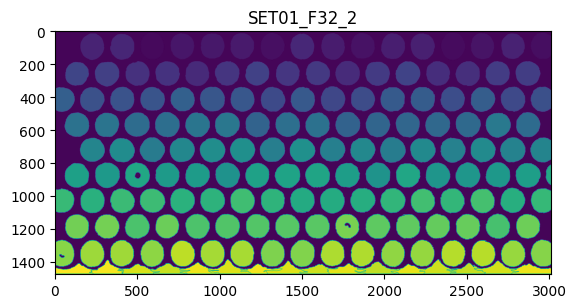

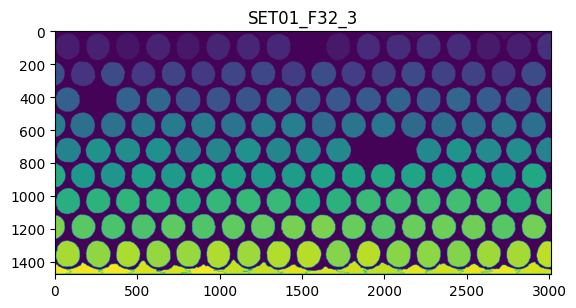

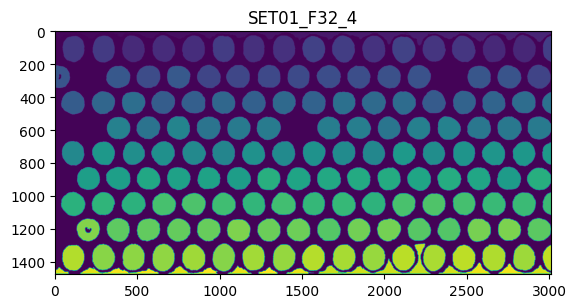

...

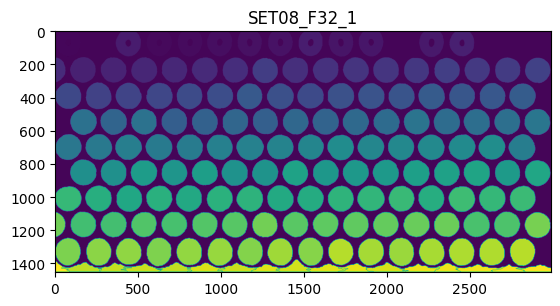

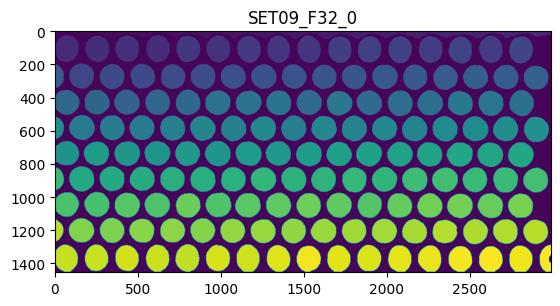

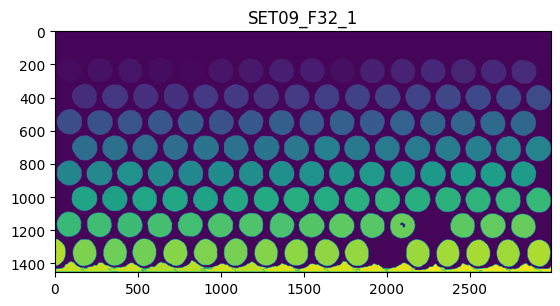

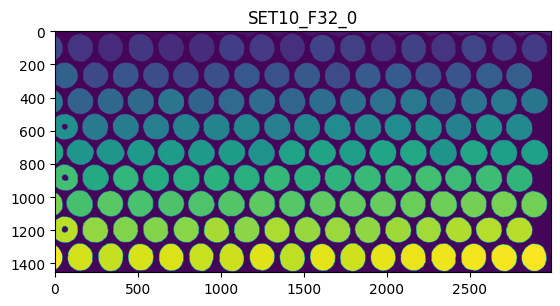

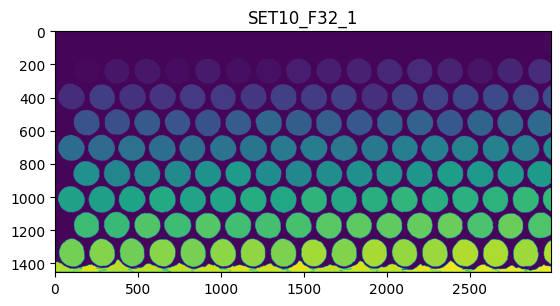

In [88]:
from celluloid import Camera # getting the camera
from IPython.display import HTML
import matplotlib.pyplot as plt
target = 'median_filter'
segmentation_npy = f'./intermediate_result/segmentation_img_{target}.npy'

segmentation_images = np.load(segmentation_npy,allow_pickle=True).item()
# gen = return_img(denoised_images)

gen = return_img_fnum(segmentation_images,['F32'])

for img_info, img in gen:
    title= "_".join(map(str,img_info.values()))
    plt.title(title)
    plt.imshow(img)
    plt.pause(0.01)


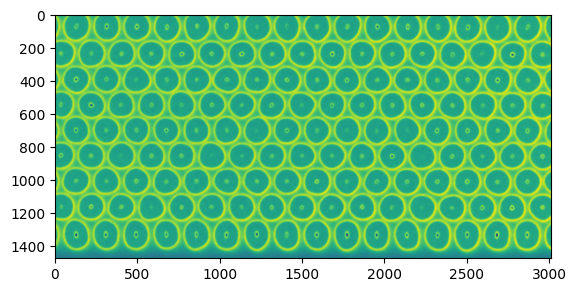

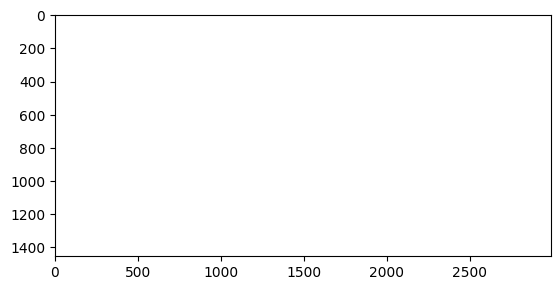

In [75]:

target = 'F16_v2'
denoised_npy = f'./intermediate_result/denoised_img_{target}_img_dict.npy'

denoised_images = np.load(denoised_npy,allow_pickle=True).item()
# gen = return_img(denoised_images)

gen = return_img_fnum(denoised_images,['F01','F02','F04','F08'])
fig, ax = plt.subplots() # make it bigger
camera = Camera(fig)# the camera gets our figure
for img_info, img in gen:
    ax.imshow(img[0]) # plotting
    camera.snap()
animation = camera.animate()
HTML(animation.to_html5_video())

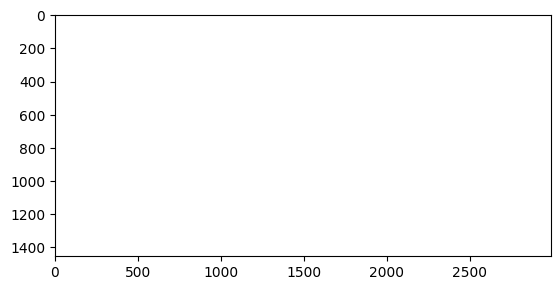

In [76]:

target = 'F16_v2'
denoised_npy = f'./intermediate_result/segmentation_img_{target}.npy'

denoised_images = np.load(denoised_npy,allow_pickle=True).item()
# gen = return_img(denoised_images)

gen = return_img_fnum(denoised_images,['F01','F02','F04','F08'])
fig, ax = plt.subplots() # make it bigger
camera = Camera(fig)# the camera gets our figure
for img_info, img in gen:
    ax.imshow(img) # plotting
    camera.snap()
animation = camera.animate()
HTML(animation.to_html5_video())

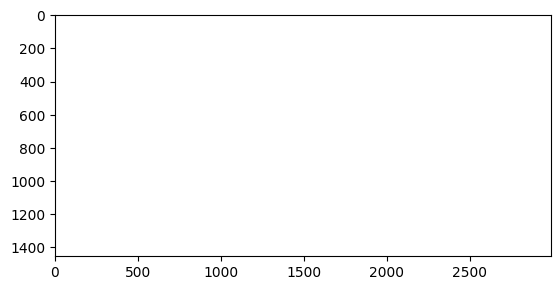

In [77]:

target = 'F08_v2'
denoised_npy = f'./intermediate_result/denoised_img_{target}_img_dict.npy'

denoised_images = np.load(denoised_npy,allow_pickle=True).item()
# gen = return_img(denoised_images)

gen = return_img_fnum(denoised_images,['F01','F02','F04'])
fig, ax = plt.subplots() # make it bigger
camera = Camera(fig)# the camera gets our figure
for img_info, img in gen:
    ax.imshow(img[0]) # plotting
    camera.snap()
animation = camera.animate()
HTML(animation.to_html5_video())

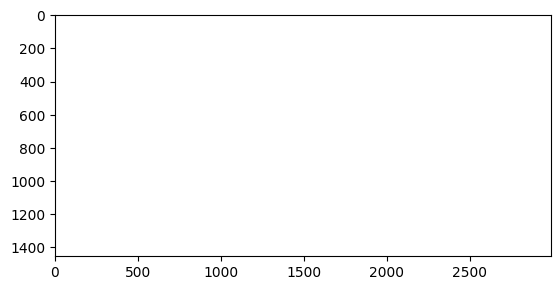

In [78]:

target = 'F08_v2'
denoised_npy = f'./intermediate_result/segmentation_img_{target}.npy'

denoised_images = np.load(denoised_npy,allow_pickle=True).item()
# gen = return_img(denoised_images)

gen = return_img_fnum(denoised_images,['F01','F02','F04'])
fig, ax = plt.subplots() # make it bigger
camera = Camera(fig)# the camera gets our figure
for img_info, img in gen:
    ax.imshow(img) # plotting
    camera.snap()
animation = camera.animate()
HTML(animation.to_html5_video())